# NLP for payments acts from different countries 

# DATA PRE PROCESSING

US REGULATION

In [3]:
import os
os.environ["USE_TF"] = "0"

In [4]:
import fitz  
import spacy

# Load spaCy model
nlp = spacy.load("en_core_web_sm")

# Increase spaCy's max_length limit
nlp.max_length = 3_000_000

# Extract text from the PDF using PyMuPDF
doc = fitz.open(r"C:\Users\neelm\OneDrive\Documents\Research ppr\fintech_laws\USA.pdf")
text = "\n".join([page.get_text() for page in doc])
doc.close()

# Tokenization using spaCy
doc = nlp(text)
tokens = [token.text for token in doc]

# Print tokens
print(tokens[:1000])

['PUBLIC', 'LAW', '111–203', '—', 'JULY', '21', ',', '2010', '\n', 'DODD', '-', 'FRANK', 'WALL', 'STREET', 'REFORM', 'AND', '\n', 'CONSUMER', 'PROTECTION', 'ACT', '\n', 'VerDate', 'Nov', '24', '2008', '\n', '00:54', 'Jul', '29', ',', '2010', '\n', 'Jkt', '089139', '\n', 'PO', '00203', '\n', 'Frm', '00001', '\n', 'Fmt', '6579', '\n', 'Sfmt', '6579', '\n', 'E:\\PUBLAW\\PUBL203.111', '\n', 'GPO1', '\n', 'PsN', ':', 'PUBL203', '\n', 'anorris', 'on', 'DSK5R6SHH1PROD', 'with', 'PUBLIC', 'LAWS', '\n\n', '124', 'STAT', '.', '1376', '\n', 'PUBLIC', 'LAW', '111–203', '—', 'JULY', '21', ',', '2010', '\n', 'Public', 'Law', '111–203', '\n', '111th', 'Congress', '\n', 'An', 'Act', '\n', 'To', 'promote', 'the', 'financial', 'stability', 'of', 'the', 'United', 'States', 'by', 'improving', 'accountability', '\n', 'and', 'transparency', 'in', 'the', 'financial', 'system', ',', 'to', 'end', '‘', '‘', 'too', 'big', 'to', 'fail', '’’', ',', 'to', 'protect', '\n', 'the', 'American', 'taxpayer', 'by', 'endin

In [5]:
# tokens as string
print([token.text for token in doc][:1000])

['PUBLIC', 'LAW', '111–203', '—', 'JULY', '21', ',', '2010', '\n', 'DODD', '-', 'FRANK', 'WALL', 'STREET', 'REFORM', 'AND', '\n', 'CONSUMER', 'PROTECTION', 'ACT', '\n', 'VerDate', 'Nov', '24', '2008', '\n', '00:54', 'Jul', '29', ',', '2010', '\n', 'Jkt', '089139', '\n', 'PO', '00203', '\n', 'Frm', '00001', '\n', 'Fmt', '6579', '\n', 'Sfmt', '6579', '\n', 'E:\\PUBLAW\\PUBL203.111', '\n', 'GPO1', '\n', 'PsN', ':', 'PUBL203', '\n', 'anorris', 'on', 'DSK5R6SHH1PROD', 'with', 'PUBLIC', 'LAWS', '\n\n', '124', 'STAT', '.', '1376', '\n', 'PUBLIC', 'LAW', '111–203', '—', 'JULY', '21', ',', '2010', '\n', 'Public', 'Law', '111–203', '\n', '111th', 'Congress', '\n', 'An', 'Act', '\n', 'To', 'promote', 'the', 'financial', 'stability', 'of', 'the', 'United', 'States', 'by', 'improving', 'accountability', '\n', 'and', 'transparency', 'in', 'the', 'financial', 'system', ',', 'to', 'end', '‘', '‘', 'too', 'big', 'to', 'fail', '’’', ',', 'to', 'protect', '\n', 'the', 'American', 'taxpayer', 'by', 'endin

comparing whitespace and spaCy tokenizer

In [6]:
# whitespace tokenizer 
print(text.split()[:1000])

# spacy tokenizer 
print([token.text for token in doc][:1000])

['PUBLIC', 'LAW', '111–203—JULY', '21,', '2010', 'DODD-FRANK', 'WALL', 'STREET', 'REFORM', 'AND', 'CONSUMER', 'PROTECTION', 'ACT', 'VerDate', 'Nov', '24', '2008', '00:54', 'Jul', '29,', '2010', 'Jkt', '089139', 'PO', '00203', 'Frm', '00001', 'Fmt', '6579', 'Sfmt', '6579', 'E:\\PUBLAW\\PUBL203.111', 'GPO1', 'PsN:', 'PUBL203', 'anorris', 'on', 'DSK5R6SHH1PROD', 'with', 'PUBLIC', 'LAWS', '124', 'STAT.', '1376', 'PUBLIC', 'LAW', '111–203—JULY', '21,', '2010', 'Public', 'Law', '111–203', '111th', 'Congress', 'An', 'Act', 'To', 'promote', 'the', 'financial', 'stability', 'of', 'the', 'United', 'States', 'by', 'improving', 'accountability', 'and', 'transparency', 'in', 'the', 'financial', 'system,', 'to', 'end', '‘‘too', 'big', 'to', 'fail’’,', 'to', 'protect', 'the', 'American', 'taxpayer', 'by', 'ending', 'bailouts,', 'to', 'protect', 'consumers', 'from', 'abusive', 'financial', 'services', 'practices,', 'and', 'for', 'other', 'purposes.', 'Be', 'it', 'enacted', 'by', 'the', 'Senate', 'and'

In [7]:
# no. of tokens in whitespace tokenizer
print(len(text.split()))

#no. of tokens in spacy's tokenizer
print(len(doc))

395384
564072


In [8]:
print(text)

PUBLIC LAW 111–203—JULY 21, 2010 
DODD-FRANK WALL STREET REFORM AND 
CONSUMER PROTECTION ACT 
VerDate Nov 24 2008 
00:54 Jul 29, 2010
Jkt 089139
PO 00203
Frm 00001
Fmt 6579
Sfmt 6579
E:\PUBLAW\PUBL203.111
GPO1
PsN: PUBL203
anorris on DSK5R6SHH1PROD with PUBLIC LAWS

124 STAT. 1376 
PUBLIC LAW 111–203—JULY 21, 2010 
Public Law 111–203 
111th Congress 
An Act 
To promote the financial stability of the United States by improving accountability 
and transparency in the financial system, to end ‘‘too big to fail’’, to protect 
the American taxpayer by ending bailouts, to protect consumers from abusive 
financial services practices, and for other purposes. 
Be it enacted by the Senate and House of Representatives of 
the United States of America in Congress assembled, 
SECTION 1. SHORT TITLE; TABLE OF CONTENTS. 
(a) SHORT TITLE.—This Act may be cited as the ‘‘Dodd-Frank 
Wall Street Reform and Consumer Protection Act’’. 
(b) TABLE OF CONTENTS.—The table of contents for this Act 
is as follow

Cleaning the text 


In [9]:
import re
from textblob import TextBlob, Word
from nltk.corpus import stopwords
import nltk

stop_words = set(stopwords.words('english'))

def clean_text(text):
    # Convert to lowercase
    text = text.lower()
    
    # Remove non-alphanumeric characters
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
    
    # Use TextBlob for part-of-speech tagging and lemmatization
    blob = TextBlob(text)
    
    lemmatized_words = []
    for word, tag in blob.tags:
        # We need to convert the TextBlob POS tag to a WordNet POS tag
        if tag.startswith('J'):
            pos = 'a'  # Adjective
        elif tag.startswith('V'):
            pos = 'v'  # Verb
        elif tag.startswith('N'):
            pos = 'n'  # Noun
        elif tag.startswith('R'):
            pos = 'r'  # Adverb
        else:
            pos = 'n'  # Default to noun
            
        lemmatized_word = Word(word).lemmatize(pos)
        lemmatized_words.append(lemmatized_word)

    # Remove stopwords
    filtered_words = [word for word in lemmatized_words if word not in stop_words]
    
    return ' '.join(filtered_words)

In [10]:
# cleaning text 
cleaned_us_text = clean_text(text)

In [11]:
print(cleaned_us_text[:1000])

public law 111203july 21 2010 doddfrank wall street reform consumer protection act verdate nov 24 2008 0054 jul 29 2010 jkt 089139 po 00203 frm 00001 fmt 6579 sfmt 6579 epublawpubl203111 gpo1 psn publ203 anorris dsk5r6shh1prod public law 124 stat 1376 public law 111203july 21 2010 public law 111203 111th congress act promote financial stability united state improve accountability transparency financial system end big fail protect american taxpayer end bailouts protect consumer abusive financial service practice purpose enact senate house representative united state america congress assemble section 1 short title table content short titlethis act may cite doddfrank wall street reform consumer protection act b table contentsthe table content act follow 1 short title table content sec 2 definition sec 3 severability sec 4 effective date sec 5 budgetary effect sec 6 antitrust saving clause title ifinancial stability sec 101 short title sec 102 definition subtitle afinancial stability overs

Finding the most frequent words in the text 

In [12]:
import spacy 

nlp = spacy.load('en_core_web_sm')

nlp.max_length = 3_000_000

doc = nlp(cleaned_us_text)

In [13]:
words_dict = {}

# add word count pair to dictionary 
for token in doc:
    #cheacking if the word is already in dictionary or not 
    if token.text in words_dict:
        #increment count of word by 1 
        words_dict[token.text] = words_dict[token.text] + 1
    else:
        # add the word in the dictionary with count 1 
        words_dict[token.text] = 1

In [14]:
import pandas as pd 

# creating a dataframe from dictionary 
df = pd.DataFrame({'word': list(words_dict.keys()), 'count': list(words_dict.values())})

# sorting dataframe in decending order 
df.sort_values(by='count', ascending= False, inplace= True, ignore_index= True)

print('Shapes=>', df.shape)

df.head(10)

Shapes=> (11743, 2)


,word,count
0,shall,3601
1,section,2917
2,financial,2706
3,act,2558
4,law,2415
5,b,2140
6,public,2114
7,swap,1917
8,commission,1905
9,company,1902


Generating word frequency

In [15]:
doc = nlp(cleaned_us_text)

In [16]:
import pandas as pd

def gen_freq(tokens):
    # Convert spaCy tokens to strings using token.text
    words = [token.text for token in tokens]
    
    # Create a pandas series with word frequencies
    word_freq = pd.Series(words).value_counts()
 
    # Print the top 20 frequencies
    print(word_freq[:20])
 
    return word_freq

In [17]:
# getting word frequency 
word_freq = gen_freq(doc)

shall         3601
section       2917
financial     2706
act           2558
law           2415
b             2140
public        2114
swap          1917
commission    1905
company       1902
2010          1883
1             1841
federal       1741
usc           1710
state         1585
security      1556
subsection    1517
may           1480
2             1466
paragraph     1398
Name: count, dtype: int64


In [18]:
import matplotlib.pyplot as plt 
from wordcloud import WordCloud

def generate_wordcloud(data):
    # specify a font path 
    wc = WordCloud(
        width=400,
        height=330,
        max_words=200,
        background_color='white',
        font_path="arial.ttf"
    ).generate_from_frequencies(data)

    # set figure size
    plt.figure(figsize=(14, 12))

    # display the wordcloud
    plt.imshow(wc, interpolation= 'bilinear')

    #remove axes
    plt.axis("off")
    plt.show() 

In [19]:
print('No. of unique words =>', len(word_freq))

No. of unique words => 11743


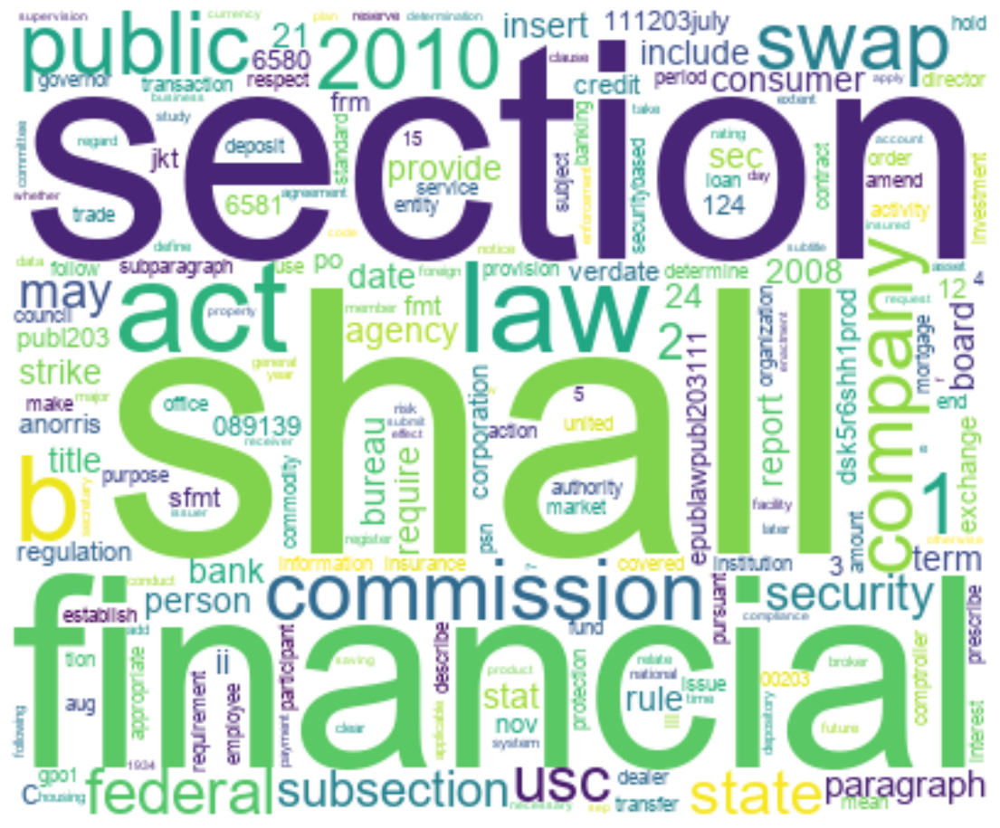

In [20]:
generate_wordcloud(word_freq)

Getting named entities 

In [21]:
doc = nlp(cleaned_us_text)

# getting named entities 
for entity in doc.ents:
    print(entity.text,'=>', entity.start_char, '=>', entity.end_char,'=>', entity.label_)

21 2010 => 22 => 29 => DATE
24 2008 => 95 => 102 => DATE
29 2010 => 112 => 119 => DATE
00001 => 144 => 149 => DATE
6579 => 154 => 158 => DATE
6579 => 164 => 168 => DATE
epublawpubl203111 gpo1 => 169 => 191 => ORG
anorris dsk5r6shh1prod public law => 204 => 237 => PERSON
124 => 238 => 241 => CARDINAL
1376 => 247 => 251 => DATE
21 2010 => 274 => 281 => DATE
111203 => 293 => 299 => DATE
111th congress => 300 => 314 => MONEY
american => 434 => 442 => NORP
senate => 531 => 537 => ORG
united state america => 559 => 579 => ORG
congress => 580 => 588 => ORG
section 1 => 598 => 607 => LAW
1 => 761 => 762 => CARDINAL
sec => 789 => 792 => ORG
2 => 793 => 794 => CARDINAL
sec => 806 => 809 => ORG
3 => 810 => 811 => CARDINAL
sec => 825 => 828 => ORG
4 => 829 => 830 => CARDINAL
sec => 846 => 849 => ORG
5 => 850 => 851 => CARDINAL
sec => 869 => 872 => ORG
6 => 873 => 874 => CARDINAL
sec => 926 => 929 => ORG
101 => 930 => 933 => PRODUCT
sec => 946 => 949 => ORG
102 => 950 => 953 => CARDINAL
sec => 1013

In [23]:
cleaned_us_text = cleaned_us_text  # from your preprocessing step

# Save as CSV file
df = pd.DataFrame([cleaned_us_text], columns=["cleaned_text"])
df.to_csv(r"C:\Users\neelm\OneDrive\Documents\Research ppr\cleaned_law\cleaned_uk_law.csv", index=False)

print('file saved successfully')

file saved successfully


UK REGULATION

In [24]:
import fitz  
import spacy

# Load spaCy model
nlp = spacy.load("en_core_web_sm")

# Increase spaCy's max_length limit
nlp.max_length = 3_000_000

# Extract text from the PDF using PyMuPDF
doc = fitz.open(r"C:\Users\neelm\OneDrive\Documents\Research ppr\fintech_laws\UK.pdf")
text = "\n".join([page.get_text() for page in doc])
doc.close()

# Tokenization using spaCy
doc = nlp(text)
tokens = [token.text for token in doc]

# Print tokens
print(tokens)

['DIRECTIVES', '\n', 'DIRECTIVE', '(', 'EU', ')', '2015/2366', 'OF', 'THE', 'EUROPEAN', 'PARLIAMENT', 'AND', 'OF', 'THE', 'COUNCIL', '\n', 'of', '25', 'November', '2015', '\n', 'on', 'payment', 'services', 'in', 'the', 'internal', 'market', ',', 'amending', 'Directives', '2002/65', '/', 'EC', ',', '2009/110', '/', 'EC', 'and', '\n', '2013/36', '/', 'EU', 'and', 'Regulation', '(', 'EU', ')', 'No', '1093/2010', ',', 'and', 'repealing', 'Directive', '2007/64', '/', 'EC', '\n', '(', 'Text', 'with', 'EEA', 'relevance', ')', '\n', 'THE', 'EUROPEAN', 'PARLIAMENT', 'AND', 'THE', 'COUNCIL', 'OF', 'THE', 'EUROPEAN', 'UNION', ',', '\n', 'Having', 'regard', 'to', 'the', 'Treaty', 'on', 'the', 'Functioning', 'of', 'the', 'European', 'Union', ',', 'and', 'in', 'particular', 'Article', '114', 'thereof', ',', '\n', 'Having', 'regard', 'to', 'the', 'proposal', 'from', 'the', 'European', 'Commission', ',', '\n', 'After', 'transmission', 'of', 'the', 'draft', 'legislative', 'act', 'to', 'the', 'national'

In [25]:
# tokens as string
print([token.text for token in doc])

['DIRECTIVES', '\n', 'DIRECTIVE', '(', 'EU', ')', '2015/2366', 'OF', 'THE', 'EUROPEAN', 'PARLIAMENT', 'AND', 'OF', 'THE', 'COUNCIL', '\n', 'of', '25', 'November', '2015', '\n', 'on', 'payment', 'services', 'in', 'the', 'internal', 'market', ',', 'amending', 'Directives', '2002/65', '/', 'EC', ',', '2009/110', '/', 'EC', 'and', '\n', '2013/36', '/', 'EU', 'and', 'Regulation', '(', 'EU', ')', 'No', '1093/2010', ',', 'and', 'repealing', 'Directive', '2007/64', '/', 'EC', '\n', '(', 'Text', 'with', 'EEA', 'relevance', ')', '\n', 'THE', 'EUROPEAN', 'PARLIAMENT', 'AND', 'THE', 'COUNCIL', 'OF', 'THE', 'EUROPEAN', 'UNION', ',', '\n', 'Having', 'regard', 'to', 'the', 'Treaty', 'on', 'the', 'Functioning', 'of', 'the', 'European', 'Union', ',', 'and', 'in', 'particular', 'Article', '114', 'thereof', ',', '\n', 'Having', 'regard', 'to', 'the', 'proposal', 'from', 'the', 'European', 'Commission', ',', '\n', 'After', 'transmission', 'of', 'the', 'draft', 'legislative', 'act', 'to', 'the', 'national'

comparing whitespace and spaCy tokenizer

In [26]:
# whitespace tokenizer 
print(text.split())

# spacy tokenizer 
print([token.text for token in doc])

['DIRECTIVES', 'DIRECTIVE', '(EU)', '2015/2366', 'OF', 'THE', 'EUROPEAN', 'PARLIAMENT', 'AND', 'OF', 'THE', 'COUNCIL', 'of', '25', 'November', '2015', 'on', 'payment', 'services', 'in', 'the', 'internal', 'market,', 'amending', 'Directives', '2002/65/EC,', '2009/110/EC', 'and', '2013/36/EU', 'and', 'Regulation', '(EU)', 'No', '1093/2010,', 'and', 'repealing', 'Directive', '2007/64/EC', '(Text', 'with', 'EEA', 'relevance)', 'THE', 'EUROPEAN', 'PARLIAMENT', 'AND', 'THE', 'COUNCIL', 'OF', 'THE', 'EUROPEAN', 'UNION,', 'Having', 'regard', 'to', 'the', 'Treaty', 'on', 'the', 'Functioning', 'of', 'the', 'European', 'Union,', 'and', 'in', 'particular', 'Article', '114', 'thereof,', 'Having', 'regard', 'to', 'the', 'proposal', 'from', 'the', 'European', 'Commission,', 'After', 'transmission', 'of', 'the', 'draft', 'legislative', 'act', 'to', 'the', 'national', 'parliaments,', 'Having', 'regard', 'to', 'the', 'opinion', 'of', 'the', 'European', 'Central', 'Bank', '(', '1', '),', 'Having', 'regar

In [27]:
# no. of tokens in whitespace tokenizer
print(len(text.split()))

#no. of tokens in spacy's tokenizer
print(len(doc))

49374
61466


In [28]:
print(text)

DIRECTIVES 
DIRECTIVE (EU) 2015/2366 OF THE EUROPEAN PARLIAMENT AND OF THE COUNCIL 
of 25 November 2015 
on payment services in the internal market, amending Directives 2002/65/EC, 2009/110/EC and 
2013/36/EU and Regulation (EU) No 1093/2010, and repealing Directive 2007/64/EC 
(Text with EEA relevance) 
THE EUROPEAN PARLIAMENT AND THE COUNCIL OF THE EUROPEAN UNION, 
Having regard to the Treaty on the Functioning of the European Union, and in particular Article 114 thereof, 
Having regard to the proposal from the European Commission, 
After transmission of the draft legislative act to the national parliaments, 
Having regard to the opinion of the European Central Bank ( 1 ), 
Having regard to the opinion of the European Economic and Social Committee ( 2 ), 
Acting in accordance with the ordinary legislative procedure ( 3 ), 
Whereas: 
(1) 
In recent years, significant progress has been achieved in integrating retail payments in the Union, in particular in 
the context of the Union acts

In [29]:
import re
from textblob import TextBlob, Word
from nltk.corpus import stopwords
import nltk

stop_words = set(stopwords.words('english'))

def clean_text(text):
    # Convert to lowercase
    text = text.lower()
    
    # Remove non-alphanumeric characters
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
    
    # Use TextBlob for part-of-speech tagging and lemmatization
    blob = TextBlob(text)
    
    lemmatized_words = []
    for word, tag in blob.tags:
        # We need to convert the TextBlob POS tag to a WordNet POS tag
        if tag.startswith('J'):
            pos = 'a'  # Adjective
        elif tag.startswith('V'):
            pos = 'v'  # Verb
        elif tag.startswith('N'):
            pos = 'n'  # Noun
        elif tag.startswith('R'):
            pos = 'r'  # Adverb
        else:
            pos = 'n'  # Default to noun
            
        lemmatized_word = Word(word).lemmatize(pos)
        lemmatized_words.append(lemmatized_word)

    # Remove stopwords
    filtered_words = [word for word in lemmatized_words if word not in stop_words]
    
    return ' '.join(filtered_words)

In [30]:
# cleaning text 
cleaned_uk_text = clean_text(text)

In [31]:
print(cleaned_uk_text)

directive directive eu 20152366 european parliament council 25 november 2015 payment service internal market amend directive 200265ec 2009110ec 201336eu regulation eu 10932010 repeal directive 200764ec text eea relevance european parliament council european union regard treaty functioning european union particular article 114 thereof regard proposal european commission transmission draft legislative act national parliament regard opinion european central bank 1 regard opinion european economic social committee 2 act accordance ordinary legislative procedure 3 whereas 1 recent year significant progress achieve integrate retail payment union particular context union act payment particular directive 200764ec european parliament council 4 regulation ec 9242009 european parliament council 5 directive 2009110ec european parliament council 6 regulation eu 2602012 european parliament council 7 directive 201183eu european parliament council 8 far complement legal framework payment service set s

In [32]:
import spacy 

nlp = spacy.load('en_core_web_sm')

doc = nlp(cleaned_uk_text)

In [33]:
words_dict = {}

# add word count pair to dictionary 
for token in doc:
    #cheacking if the word is already in dictionary or not 
    if token.text in words_dict:
        #increment count of word by 1 
        words_dict[token.text] = words_dict[token.text] + 1
    else:
        # add the word in the dictionary with count 1 
        words_dict[token.text] = 1

In [34]:
import pandas as pd 

# creating a dataframe from dictionary 
df = pd.DataFrame({'word': list(words_dict.keys()), 'count': list(words_dict.values())})

# sorting dataframe in decending order 
df.sort_values(by='count', ascending= False, inplace= True, ignore_index= True)

print('Shapes=>', df.shape)

df.head(10)

Shapes=> (2622, 2)


,word,count
0,payment,1872
1,service,1178
2,article,1053
3,provider,583
4,shall,518
5,directive,363
6,transaction,341
7,state,317
8,member,315
9,provide,260


Generating word frequency

In [35]:
import pandas as pd

def gen_freq(tokens):
    # Convert spaCy tokens to strings using token.text
    words = [token.text for token in tokens]
    
    # Create a pandas series with word frequencies
    word_freq = pd.Series(words).value_counts()
 
    # Print the top 20 frequencies
    print(word_freq[:20])
 
    return word_freq

In [36]:
# getting word frequency 
word_freq = gen_freq(doc)

payment        1872
service        1178
article        1053
provider        583
shall           518
directive       363
transaction     341
state           317
member          315
provide         260
account         258
payer           256
information     255
institution     248
1               242
authority       235
user            220
european        212
competent       200
2               174
Name: count, dtype: int64


In [37]:
import matplotlib.pyplot as plt 
from wordcloud import WordCloud

def generate_wordcloud(data):
    # specify a font path 
    wc = WordCloud(
        width=400,
        height=330,
        max_words=200,
        background_color='white',
        font_path="arial.ttf"
    ).generate_from_frequencies(data)

    # set figure size
    plt.figure(figsize=(14, 12))

    # display the wordcloud
    plt.imshow(wc, interpolation= 'bilinear')

    #remove axes
    plt.axis("off")
    plt.show() 

In [38]:
print('No. of unique words =>', len(word_freq))

No. of unique words => 2622


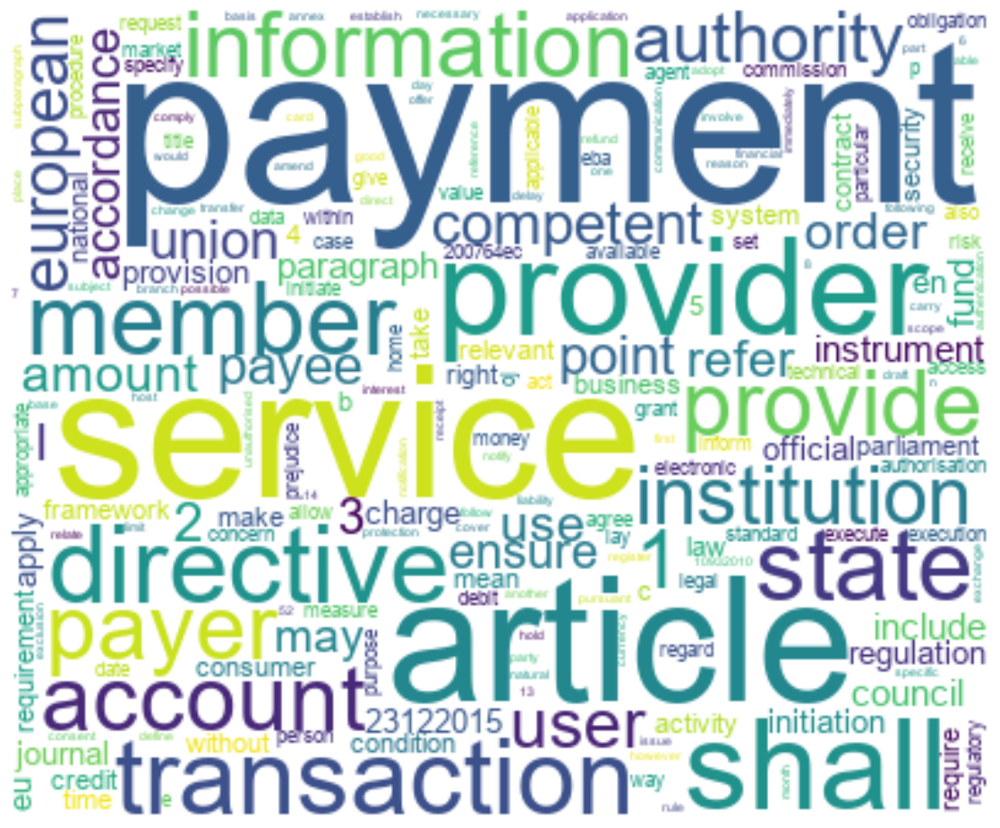

In [39]:
generate_wordcloud(word_freq)

Getting named entities

In [40]:
doc = nlp(cleaned_uk_text)

# getting named entities 
for entity in doc.ents:
    print(entity.text,'=>', entity.start_char, '=>', entity.end_char,'=>', entity.label_)

20152366 => 23 => 31 => CARDINAL
european => 32 => 40 => NORP
25 november 2015 => 60 => 76 => DATE
200265ec => 125 => 133 => CARDINAL
2009110ec => 134 => 143 => TIME
eu => 164 => 166 => PERSON
10932010 => 167 => 175 => DATE
200764ec => 193 => 201 => ORDINAL
european => 221 => 229 => NORP
parliament council european union => 230 => 263 => ORG
european union => 290 => 304 => ORG
article 114 => 316 => 327 => LAW
european => 352 => 360 => NORP
european => 442 => 450 => NORP
1 => 464 => 465 => CARDINAL
european => 481 => 489 => NORP
2 => 516 => 517 => CARDINAL
3 => 564 => 565 => CARDINAL
1 => 574 => 575 => CARDINAL
200764ec european => 706 => 723 => NORP
4 => 743 => 744 => CARDINAL
ec => 756 => 758 => ORG
9242009 => 759 => 766 => DATE
european => 767 => 775 => NORP
5 => 795 => 796 => CARDINAL
2009110ec => 807 => 816 => ORDINAL
european => 817 => 825 => NORP
6 regulation eu => 845 => 860 => QUANTITY
2602012 => 861 => 868 => CARDINAL
european parliament council => 869 => 896 => ORG
7 => 897 =

In [41]:
cleaned__text = cleaned_uk_text  # from your preprocessing step

# Save as CSV file
df = pd.DataFrame([cleaned__text], columns=["cleaned_text"])
df.to_csv(r"C:\Users\neelm\OneDrive\Documents\Research ppr\cleaned_law\cleaned_uk_law.csv", index=False)

print('file saved successfully')

file saved successfully


INDIA REGULATION

In [42]:
import fitz  
import spacy

# Load spaCy model
nlp = spacy.load("en_core_web_sm")

# Increase spaCy's max_length limit
nlp.max_length = 2_000_000

# Extract text from the PDF using PyMuPDF
doc = fitz.open(r"C:\Users\neelm\OneDrive\Documents\Research ppr\fintech_laws\India.pdf")
text = "\n".join([page.get_text() for page in doc])
doc.close()

# Tokenization using spaCy
doc = nlp(text)
tokens = [token.text for token in doc]

# Print tokens
print(tokens)


['1', '\n \n', 'THE', 'PAYMENT', 'AND', 'SETTLEMENT', 'SYSTEMS', 'ACT', ',', '2007', '\n', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '\n', 'ARRANGEMENT', 'OF', 'SECTIONS', '\n', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '\n', 'CHAPTER', 'I', '\n', 'PRELIMINARY', '\n', 'SECTIONS', '\n', '1', '.', 'Short', 'title', ',', 'extent', 'and', 'commencement', '.', '\n', '2', '.', 'Definitions', '.', '\n \n', 'CHAPTER', 'II', '\n', 'DESIGNATED', 'AUTHORITY', ' \n', '3', '.', 'Designated', 'authority', '.', '\n \n', 'CHAPTER', 'III', '\n', 'AUTHORISATION', 'OF', 'PAYMENT', 'SYSTEMS', '\n', '4', '.', 'Payment', 'system', 'not', 'to', 'operate', 'without', 'authorisation', '.', '\n', '5', '.', 'Application', 'for', 'authorisation', '.', '\n', '6', '.', 'Inquiry', 'by', 'the', 'Reserve', 'Bank', '.', '\n', '7', '.', 'Issue', 'or', 'refusal', 'of', 'authorisation', '.', '\n', '8', '.', 'Revocation', 'of', 'authorisation', '.', '\n', '9', '.', 'Appeal', 'to', 'the',

In [43]:
#tokens as string 
print([token.text for token in doc])

['1', '\n \n', 'THE', 'PAYMENT', 'AND', 'SETTLEMENT', 'SYSTEMS', 'ACT', ',', '2007', '\n', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '\n', 'ARRANGEMENT', 'OF', 'SECTIONS', '\n', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '\n', 'CHAPTER', 'I', '\n', 'PRELIMINARY', '\n', 'SECTIONS', '\n', '1', '.', 'Short', 'title', ',', 'extent', 'and', 'commencement', '.', '\n', '2', '.', 'Definitions', '.', '\n \n', 'CHAPTER', 'II', '\n', 'DESIGNATED', 'AUTHORITY', ' \n', '3', '.', 'Designated', 'authority', '.', '\n \n', 'CHAPTER', 'III', '\n', 'AUTHORISATION', 'OF', 'PAYMENT', 'SYSTEMS', '\n', '4', '.', 'Payment', 'system', 'not', 'to', 'operate', 'without', 'authorisation', '.', '\n', '5', '.', 'Application', 'for', 'authorisation', '.', '\n', '6', '.', 'Inquiry', 'by', 'the', 'Reserve', 'Bank', '.', '\n', '7', '.', 'Issue', 'or', 'refusal', 'of', 'authorisation', '.', '\n', '8', '.', 'Revocation', 'of', 'authorisation', '.', '\n', '9', '.', 'Appeal', 'to', 'the',

comparing whitespaces and spaCy tokenizer 

In [44]:
# whitespace tokenizer 
print(text.split())

#spacy tokenizer 
print([token.text for token in doc])

['1', 'THE', 'PAYMENT', 'AND', 'SETTLEMENT', 'SYSTEMS', 'ACT,', '2007', '____________', 'ARRANGEMENT', 'OF', 'SECTIONS', '____________', 'CHAPTER', 'I', 'PRELIMINARY', 'SECTIONS', '1.', 'Short', 'title,', 'extent', 'and', 'commencement.', '2.', 'Definitions.', 'CHAPTER', 'II', 'DESIGNATED', 'AUTHORITY', '3.', 'Designated', 'authority.', 'CHAPTER', 'III', 'AUTHORISATION', 'OF', 'PAYMENT', 'SYSTEMS', '4.', 'Payment', 'system', 'not', 'to', 'operate', 'without', 'authorisation.', '5.', 'Application', 'for', 'authorisation.', '6.', 'Inquiry', 'by', 'the', 'Reserve', 'Bank.', '7.', 'Issue', 'or', 'refusal', 'of', 'authorisation.', '8.', 'Revocation', 'of', 'authorisation.', '9.', 'Appeal', 'to', 'the', 'Central', 'Government.', 'CHAPTER', 'IV', 'REGULATION', 'AND', 'SUPERVISION', 'BY', 'THE', 'RESERVE', 'BANK', '10.', 'Power', 'to', 'determine', 'standards.', '10A.', 'Bank,', 'etc.,', 'not', 'to', 'impose', 'charge', 'for', 'using', 'electronic', 'modes', 'of', 'payment.', '11.', 'Notice', 

In [45]:
# no. of tokens in whitespace tokenizer 
print(len(text.split()))

# no. of tokens in spacy's tokenizer 
print(len(doc))

9704
12337


In [46]:
print(text)

1 
 
THE PAYMENT AND SETTLEMENT SYSTEMS ACT, 2007 
____________ 
ARRANGEMENT OF SECTIONS 
____________ 
CHAPTER I 
PRELIMINARY 
SECTIONS 
1. Short title, extent and commencement. 
2. Definitions. 
 
CHAPTER II 
DESIGNATED AUTHORITY  
3. Designated authority. 
 
CHAPTER III 
AUTHORISATION OF PAYMENT SYSTEMS 
4. Payment system not to operate without authorisation. 
5. Application for authorisation. 
6. Inquiry by the Reserve Bank. 
7. Issue or refusal of authorisation. 
8. Revocation of authorisation. 
9. Appeal to the Central Government. 
 
CHAPTER IV 
REGULATION AND SUPERVISION BY THE RESERVE BANK 
10. Power to determine standards. 
10A. Bank, etc., not to impose charge for using electronic modes of payment. 
11. Notice of change in the payment system. 
12. Power to call for returns, documents or other information. 
13. Access to information. 
14. Power to enter and inspect. 
15. Information, etc., to be confidential. 
16. Power to carry out audit and inspection. 
17. Power to issue di

Cleaning the text

In [47]:
import re
from textblob import TextBlob, Word
from nltk.corpus import stopwords
import nltk

stop_words = set(stopwords.words('english'))

def clean_text(text):
    # Convert to lowercase
    text = text.lower()
    
    # Remove non-alphanumeric characters
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
    
    # Use TextBlob for part-of-speech tagging and lemmatization
    blob = TextBlob(text)
    
    lemmatized_words = []
    for word, tag in blob.tags:
        # We need to convert the TextBlob POS tag to a WordNet POS tag
        if tag.startswith('J'):
            pos = 'a'  # Adjective
        elif tag.startswith('V'):
            pos = 'v'  # Verb
        elif tag.startswith('N'):
            pos = 'n'  # Noun
        elif tag.startswith('R'):
            pos = 'r'  # Adverb
        else:
            pos = 'n'  # Default to noun
            
        lemmatized_word = Word(word).lemmatize(pos)
        lemmatized_words.append(lemmatized_word)

    # Remove stopwords
    filtered_words = [word for word in lemmatized_words if word not in stop_words]
    
    return ' '.join(filtered_words)

In [48]:
# cleaning text 
cleaned_india_text = clean_text(text)

In [49]:
print(cleaned_india_text)

1 payment settlement system act 2007 arrangement section chapter preliminary section 1 short title extent commencement 2 definition chapter ii designate authority 3 designate authority chapter iii authorisation payment system 4 payment system operate without authorisation 5 application authorisation 6 inquiry reserve bank 7 issue refusal authorisation 8 revocation authorisation 9 appeal central government chapter iv regulation supervision reserve bank 10 power determine standard 10a bank etc impose charge use electronic mode payment 11 notice change payment system 12 power call returns document information 13 access information 14 power enter inspect 15 information etc confidential 16 power carry audit inspection 17 power issue direction 18 power reserve bank give direction generally 19 direction reserve bank comply chapter v right duty system provider 20 system provider act accordance act regulation etc 21 duty system provider 22 duty keep document payment system confidential 23 settl

Finding the most frequent words in the text 

In [50]:
import spacy 

nlp = spacy.load('en_core_web_sm')

nlp.max_length = 2_000_000

doc = nlp(cleaned_india_text)

In [51]:
words_dict = {}

# add word count pair to dictionary 
for token in doc:
    # checking if the word is already in dictionary or not 
    if token.text in words_dict:
        # increment count of word by 1 
        words_dict[token.text] = words_dict[token.text] + 1
    else:
        # add the word in the dictionary with count 1 
        words_dict[token.text] = 1

In [52]:
import pandas as pd

# creating a dataframe from dictionary 
df = pd.DataFrame({'word': list(words_dict.keys()), 'count': list(words_dict.values())})

# sorting dataframe in decending order 
df.sort_values(by='count', ascending= False, inplace= True, ignore_index= True)

print('Shapes=>', df.shape)

df.head(10)

Shapes=> (938, 2)


,word,count
0,system,194
1,bank,154
2,shall,135
3,reserve,126
4,payment,126
5,act,126
6,may,99
7,section,69
8,2,63
9,person,58


Generating word frequency 

In [53]:
import pandas as pd

def gen_freq(tokens):
    # Convert spaCy tokens to strings using token.text
    words = [token.text for token in tokens]
    
    # Create a pandas series with word frequencies
    word_freq = pd.Series(words).value_counts()
 
    # Print the top 20 frequencies
    print(word_freq[:20])
 
    return word_freq

In [54]:
# getting word frequency 
word_freq = gen_freq(doc)

system           194
bank             154
shall            135
reserve          126
payment          126
act              126
may               99
section           69
2                 63
person            58
provider          52
regulation        49
time              49
make              47
subsection        43
provision         39
participant       39
1                 37
authorisation     34
settlement        34
Name: count, dtype: int64


In [55]:
import matplotlib.pyplot as plt 
from wordcloud import WordCloud

def generate_wordcloud(data):
    # specify a font path 
    wc = WordCloud(
        width=400,
        height=330,
        max_words=200,
        background_color='white',
        font_path="arial.ttf"
    ).generate_from_frequencies(data)

    # set figure size 
    plt.figure(figsize=(14,12))

    # display the wordcloud 
    plt.imshow(wc, interpolation= 'bilinear')

    # remove axes 
    plt.axis("off")
    plt.show()

In [56]:
print('No. of unique words =>', len(word_freq))

No. of unique words => 938


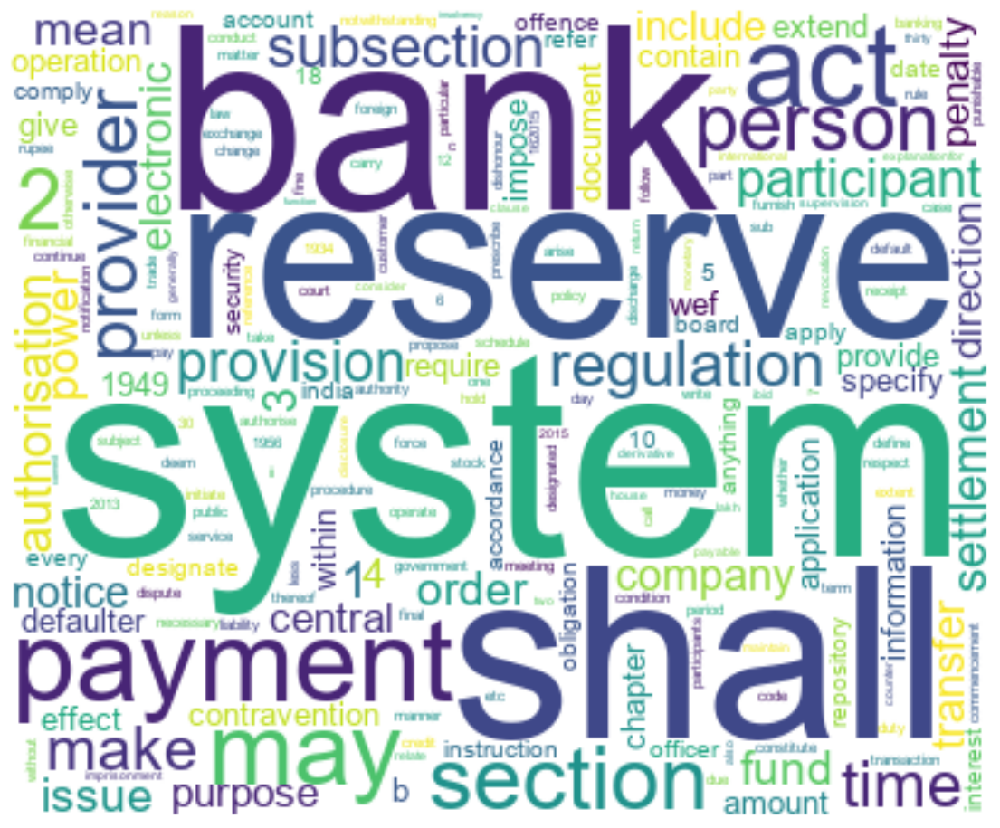

In [57]:
generate_wordcloud(word_freq)

Getting named entities 

In [58]:
doc = nlp(cleaned_india_text)

# getting named entities 
for entity in doc.ents:
    print(entity.text, '=>', entity.start_char, '=>', entity.end_char, '=>', entity.label_)

1 => 0 => 1 => CARDINAL
2007 => 32 => 36 => DATE
section 1 => 77 => 86 => LAW
2 => 119 => 120 => CARDINAL
3 => 163 => 164 => CARDINAL
chapter iii => 185 => 196 => LAW
4 => 226 => 227 => CARDINAL
5 => 273 => 274 => CARDINAL
6 => 301 => 302 => CARDINAL
7 => 324 => 325 => CARDINAL
8 => 354 => 355 => CARDINAL
9 => 381 => 382 => CARDINAL
regulation supervision reserve bank => 420 => 455 => ORG
10 => 456 => 458 => CARDINAL
10a => 484 => 487 => CARDINAL
11 => 539 => 541 => CARDINAL
12 => 571 => 573 => CARDINAL
13 => 614 => 616 => CARDINAL
14 => 636 => 638 => CARDINAL
15 => 659 => 661 => CARDINAL
16 => 691 => 693 => CARDINAL
17 => 723 => 725 => CARDINAL
18 => 748 => 750 => CARDINAL
19 => 795 => 797 => CARDINAL
reserve bank => 808 => 820 => ORG
20 => 865 => 867 => CARDINAL
21 => 918 => 920 => CARDINAL
22 => 942 => 944 => CARDINAL
23 => 992 => 994 => CARDINAL
23a => 1010 => 1013 => CARDINAL
2 => 1047 => 1048 => CARDINAL
24 => 1087 => 1089 => CARDINAL
25 => 1109 => 1111 => CARDINAL
26 => 1206 => 

In [59]:
cleaned_text = cleaned_india_text 

df = pd.DataFrame([cleaned_text], columns=["cleaned_text"])
df.to_csv(r"C:\Users\neelm\OneDrive\Documents\Research ppr\cleaned_law\cleaned_india_law.csv", index=False)

print('file saved successfully')

file saved successfully


# TF-IDF Vectorization


In [67]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Step 1: Load cleaned CSV files
df_india = pd.read_csv(r"cleaned_law\cleaned_india_law.csv")
df_uk = pd.read_csv(r"cleaned_law\cleaned_uk_law.csv")
df_us = pd.read_csv(r"cleaned_law\cleaned_us_law.csv")

# Step 2: Extract and join text (assuming cleaned text is in the first column)
text_india = " ".join(df_india["cleaned_text"].astype(str).tolist())
text_uk = " ".join(df_uk["cleaned_text"].astype(str).tolist())
text_us = " ".join(df_us["cleaned_text"].astype(str).tolist())

# Step 3: TF-IDF vectorization
documents = [text_india, text_uk, text_us]
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(documents)

# Optional: View TF-IDF matrix as DataFrame (rows=docs, cols=words)
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), index=["India", "UK", "US"], columns=vectorizer.get_feature_names_out())
print("TF-IDF Matrix:\n")
print(tfidf_df)

TF-IDF Matrix:

            000     00000     00001     00002     00003     00004     00005  \
India  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
UK     0.001643  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
US     0.000000  0.011425  0.000114  0.000114  0.000114  0.000114  0.000114   

          00006     00007     00008  ...  yearsnot       yes       yet  \
India  0.000000  0.000000  0.000000  ...  0.000000  0.000000  0.000000   
UK     0.000000  0.000000  0.000000  ...  0.000000  0.000548  0.000833   
US     0.000114  0.000114  0.000114  ...  0.000114  0.000000  0.000869   

          yield      york     young      ysis      zero      zine      zone  
India  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.002844  
UK     0.000000  0.000000  0.000000  0.000000  0.000548  0.000000  0.000000  
US     0.000685  0.000228  0.000114  0.000343  0.000000  0.000114  0.000348  

[3 rows x 12746 columns]


In [68]:
# Step 4: Compute cosine similarity
cosine_sim = cosine_similarity(tfidf_matrix)

# Step 5: Show cosine similarity matrix
cosine_df = pd.DataFrame(cosine_sim, index=["India", "UK", "US"], columns=["India", "UK", "US"])
print("\n Cosine Similarity Matrix:\n")
print(cosine_df)



 Cosine Similarity Matrix:

          India        UK        US
India  1.000000  0.362038  0.387633
UK     0.362038  1.000000  0.208904
US     0.387633  0.208904  1.000000


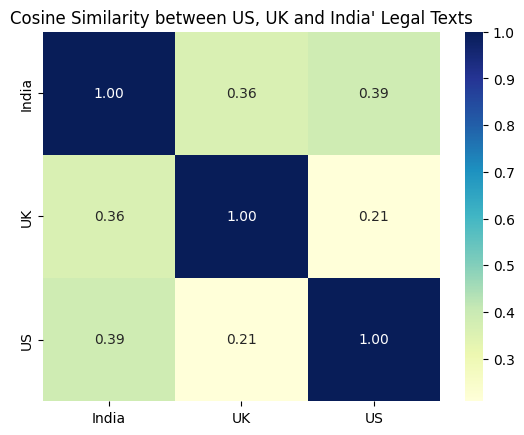

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(cosine_df, annot=True, cmap='YlGnBu', fmt=".2f")
plt.title("Cosine Similarity between US, UK and India' Legal Texts")
plt.show()


# BERT

In [72]:
import pandas as pd
import numpy as np
from sentence_transformers import SentenceTransformer
from scipy.spatial.distance import cosine


model = SentenceTransformer('bert-base-nli-mean-tokens')

def get_embedding(text):
    return model.encode(text)


files = {
    "US": r"cleaned_law\cleaned_us_law.csv",
    "India": r"cleaned_law\cleaned_india_law.csv",
    "UK": r"cleaned_law\cleaned_uk_law.csv"
}

docs = {}
for country, file in files.items():
    df = pd.read_csv(file)
    docs[country] = " ".join(df['cleaned_text'].astype(str))


embeddings = {name: get_embedding(text) for name, text in docs.items()}

names = list(embeddings.keys())
print("\nSimilarity Matrix:")
for i in range(len(names)):
    row = []
    for j in range(len(names)):
        sim = 1 - cosine(embeddings[names[i]], embeddings[names[j]])
        row.append(f"{sim:.4f}")
    print(f"{names[i]:<6}: {'  '.join(row)}")


Similarity Matrix:
US    : 1.0000  0.7180  0.7510
India : 0.7180  1.0000  0.7087
UK    : 0.7510  0.7087  1.0000


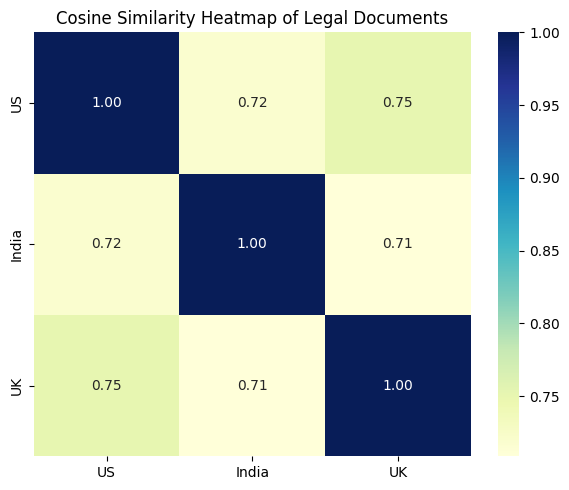

In [73]:
import seaborn as sns
import numpy as np

matrix = np.zeros((len(names), len(names)))
for i in range(len(names)):
	for j in range(len(names)):
		matrix[i, j] = 1 - cosine(embeddings[names[i]], embeddings[names[j]])

plt.figure(figsize=(6, 5))
sns.heatmap(matrix, xticklabels=names, yticklabels=names, annot=True, cmap='YlGnBu', fmt=".2f")
plt.title("Cosine Similarity Heatmap of Legal Documents")
plt.tight_layout()
plt.show()

# Sentiment Analysis

In [74]:
import fitz  
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

def analyze_pdf(path, name):
    print(f"\nAnalyzing: {name}")
    try:
        # Extract text from PDF
        text = ""
        for page in fitz.open(path):
            text += page.get_text()
        sentences = nltk.sent_tokenize(text)
        if not sentences:
            print("No text found in PDF.")
            return
    except:
        print("Failed to read the PDF.")
        return

    
    sid = SentimentIntensityAnalyzer()
    pos, neg, neu = 0, 0, 0
    for s in sentences:
        score = sid.polarity_scores(s)['compound']
        if score >= 0.05:
            pos += 1
        elif score <= -0.05:
            neg += 1
        else:
            neu += 1

    total = len(sentences)
    print(f"Neutral:  {neu / total:.2%}")
    print(f"Positive: {pos / total:.2%}")
    print(f"Negative: {neg / total:.2%}")


pdfs = {
    "US Law": r"fintech_laws\USA.pdf",
    "India Law": r"fintech_laws\India.pdf",
    "UK Law": r"fintech_laws\UK.pdf"
}

for name, path in pdfs.items():
    analyze_pdf(path, name)


Analyzing: US Law
Neutral:  52.86%
Positive: 32.85%
Negative: 14.29%

Analyzing: India Law
Neutral:  66.87%
Positive: 19.88%
Negative: 13.25%

Analyzing: UK Law
Neutral:  40.23%
Positive: 45.06%
Negative: 14.70%
